### Objective is to classify whether the tumor malignant or benign (M -malignantor ,B - benign)
- Dataset : https://www.kaggle.com/uciml/breast-cancer-wisconsin-data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_csv('breastcancer.csv')
data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [4]:
data.isna().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

In [5]:
data.drop(columns= ['id','Unnamed: 32'], axis = 1 , inplace = True)
data.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [12]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
radius_mean,569.0,14.127292,3.524049,6.981000,11.700000,13.370000,15.780000,28.11000
texture_mean,569.0,19.289649,4.301036,9.710000,16.170000,18.840000,21.800000,39.28000
perimeter_mean,569.0,91.969033,24.298981,43.790000,75.170000,86.240000,104.100000,188.50000
area_mean,569.0,654.889104,351.914129,143.500000,420.300000,551.100000,782.700000,2501.00000
smoothness_mean,569.0,0.096360,0.014064,0.052630,0.086370,0.095870,0.105300,0.16340
compactness_mean,569.0,0.104341,0.052813,0.019380,0.064920,0.092630,0.130400,0.34540
concavity_mean,569.0,0.088799,0.079720,0.000000,0.029560,0.061540,0.130700,0.42680
concave points_mean,569.0,0.048919,0.038803,0.000000,0.020310,0.033500,0.074000,0.20120
symmetry_mean,569.0,0.181162,0.027414,0.106000,0.161900,0.179200,0.195700,0.30400
fractal_dimension_mean,569.0,0.062798,0.007060,0.049960,0.057700,0.061540,0.066120,0.09744


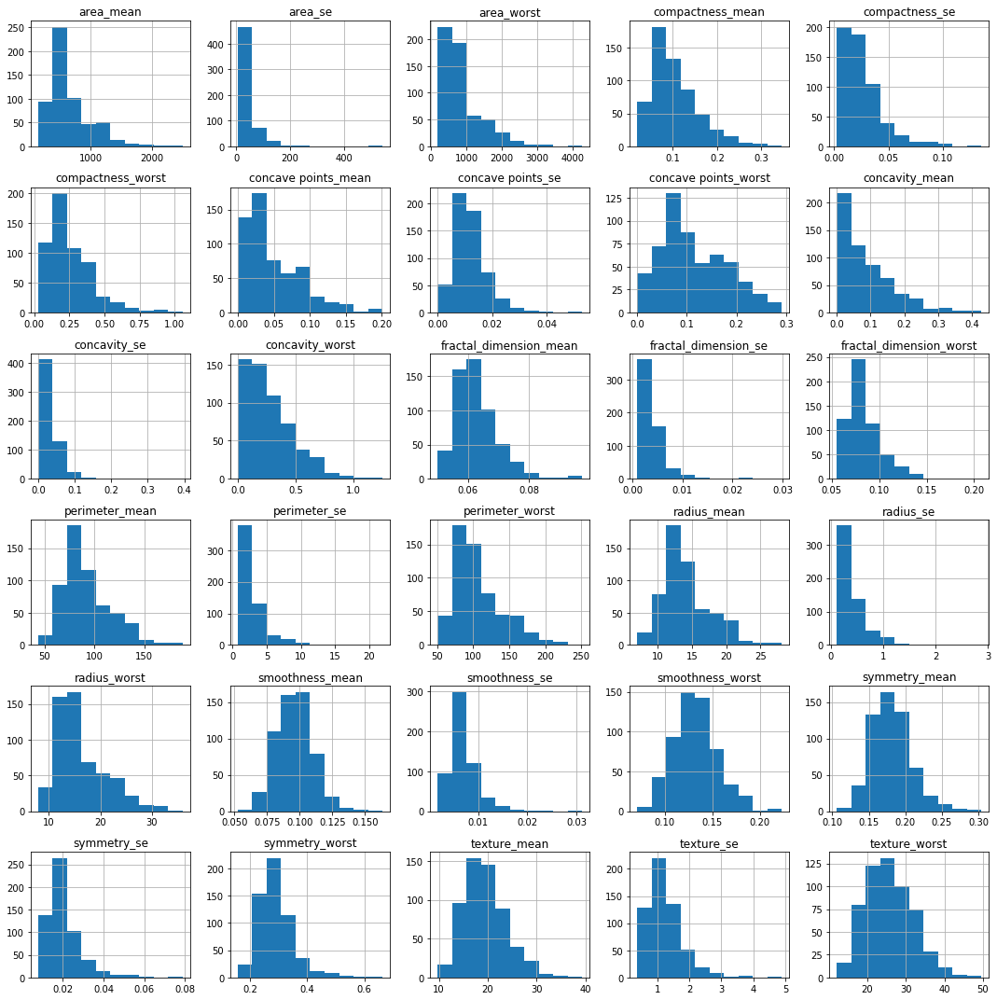

In [6]:
data.select_dtypes(include= np.float).hist(figsize = (15,15))
plt.tight_layout()
plt.show()

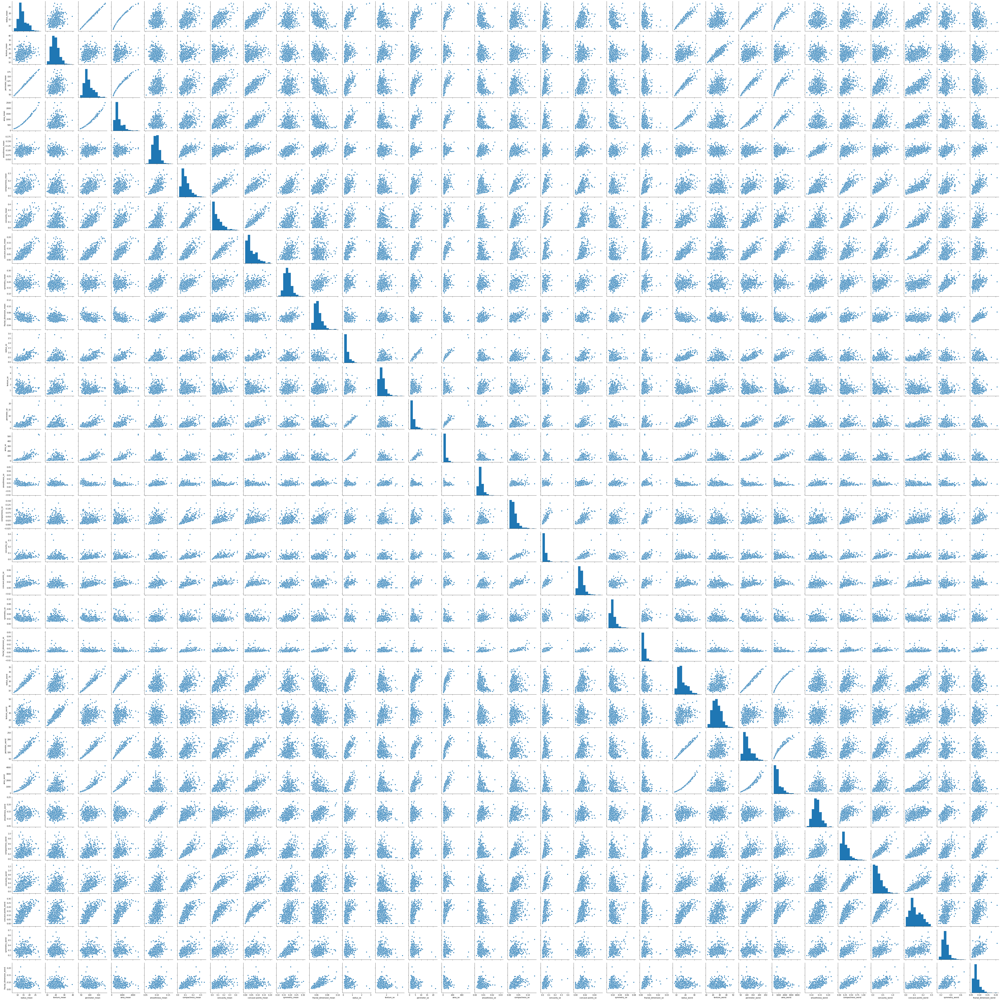

In [7]:
sns.pairplot(data.select_dtypes(include= np.float))
plt.tight_layout()
plt.show()

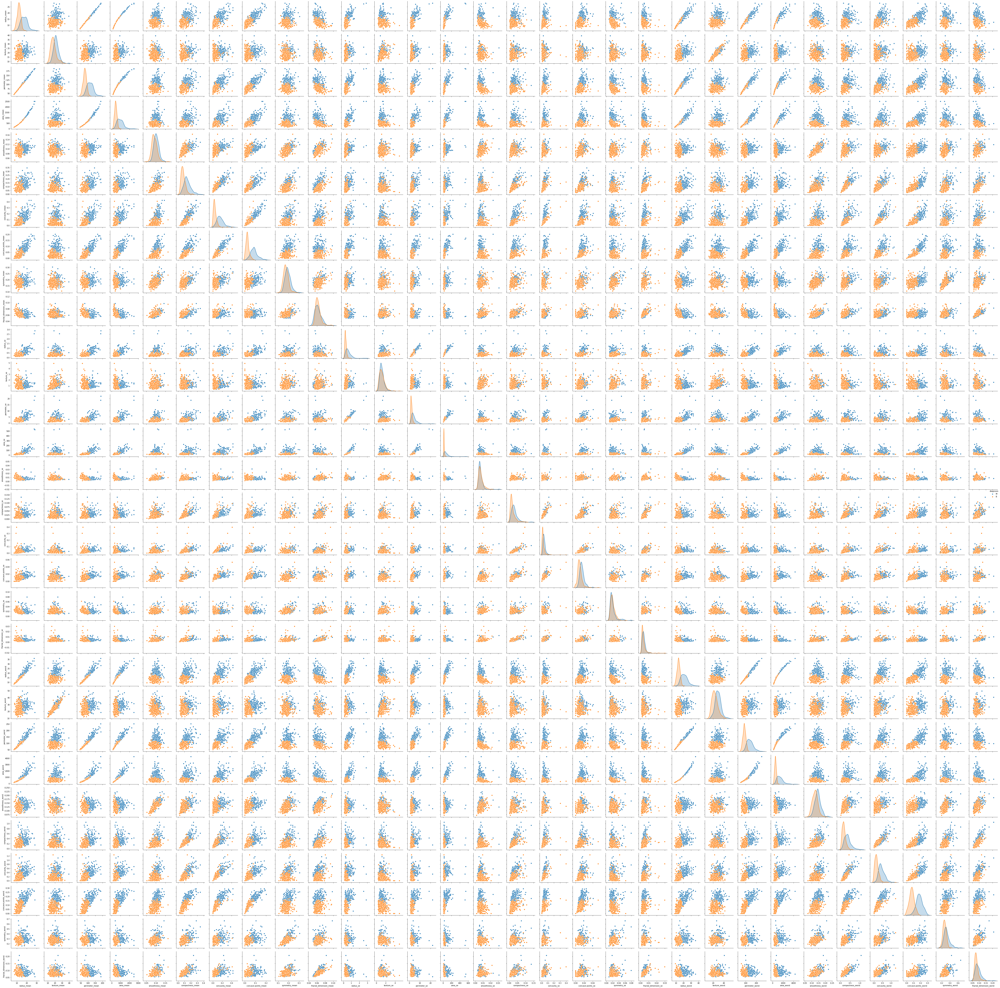

In [9]:
sns.pairplot(data, hue = 'diagnosis')
plt.tight_layout()
plt.show()

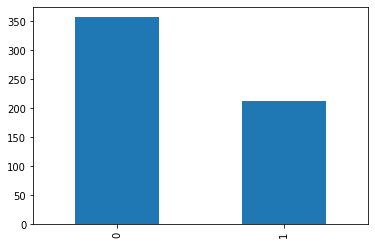

In [21]:
data['diagnosis'].value_counts().plot(kind = 'bar')
plt.show()

In [14]:
data['diagnosis'].unique()

array(['M', 'B'], dtype=object)

In [15]:
data['diagnosis'] = data['diagnosis'].apply(lambda x : 1 if x == 'M' else 0)
data['diagnosis'].unique()

array([1, 0], dtype=int64)

In [17]:
X = data.iloc[:,1:].values
y = data.iloc[:, 0].values

In [18]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 20)

In [19]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [27]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from xgboost import XGBRFClassifier

In [28]:
classication_lr = LogisticRegression()
classication_lr.fit(X_train,y_train)

classication_dt = DecisionTreeClassifier()
classication_dt.fit(X_train,y_train)

classication_rf = RandomForestClassifier()
classication_rf.fit(X_train,y_train)

classication_svc = SVC()
classication_svc.fit(X_train,y_train)

classication_knn = KNeighborsClassifier()
classication_knn.fit(X_train,y_train)

classication_xgb = XGBClassifier()
classication_xgb.fit(X_train,y_train)

classication_xgbrf = XGBRFClassifier()
classication_xgbrf.fit(X_train,y_train)



XGBRFClassifier(base_score=0.5, colsample_bylevel=1, colsample_bynode=0.8,
                colsample_bytree=1, gamma=0, learning_rate=1, max_delta_step=0,
                max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
                n_jobs=1, nthread=None, objective='binary:logistic',
                random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
                seed=None, silent=None, subsample=0.8, verbosity=1)

In [30]:
print('training score : {}, test score : {}'.format(classication_lr.score(X_train, y_train), classication_lr.score(X_test, y_test)))
print('training score : {}, test score : {}'.format(classication_dt.score(X_train, y_train), classication_dt.score(X_test, y_test)))
print('training score : {}, test score : {}'.format(classication_rf.score(X_train, y_train), classication_rf.score(X_test, y_test)))
print('training score : {}, test score : {}'.format(classication_svc.score(X_train, y_train), classication_svc.score(X_test, y_test)))
print('training score : {}, test score : {}'.format(classication_knn.score(X_train, y_train), classication_knn.score(X_test, y_test)))
print('training score : {}, test score : {}'.format(classication_xgb.score(X_train, y_train), classication_xgb.score(X_test, y_test)))
print('training score : {}, test score : {}'.format(classication_xgbrf.score(X_train, y_train), classication_xgbrf.score(X_test, y_test)))


training score : 0.9868131868131869, test score : 0.9912280701754386
training score : 1.0, test score : 0.9473684210526315
training score : 0.9978021978021978, test score : 0.9736842105263158
training score : 0.9846153846153847, test score : 0.9912280701754386
training score : 0.9714285714285714, test score : 0.956140350877193
training score : 1.0, test score : 0.9824561403508771
training score : 0.9824175824175824, test score : 0.9824561403508771


In [31]:
y_pred_lr = classication_lr.predict(X_test)
y_pred_dt = classication_dt.predict(X_test)
y_pred_rf = classication_rf.predict(X_test)
y_pred_svc = classication_svc.predict(X_test)
y_pred_knn = classication_knn.predict(X_test)
y_pred_xgb = classication_xgb.predict(X_test)
y_pred_xgbrf = classication_xgbrf.predict(X_test)


In [34]:
from sklearn.metrics import confusion_matrix, classification_report
cm_lr = confusion_matrix(y_test, y_pred_lr)
print('logistic reg: {}'.format(cm_lr), '\n')

cm_dt = confusion_matrix(y_test, y_pred_dt)
print('decison tree classif: {}'.format(cm_dt), '\n')

cm_rf = confusion_matrix(y_test, y_pred_rf)
print('randomforest classif: {}'.format(cm_rf), '\n')

cm_svc = confusion_matrix(y_test, y_pred_svc)
print('svc classif: {}'.format(cm_svc), '\n')

cm_knn = confusion_matrix(y_test, y_pred_knn)
print('knn classif: {}'.format(cm_knn), '\n')

cm_xgb = confusion_matrix(y_test, y_pred_xgb)
print('xgboost tree classif: {}'.format(cm_xgb), '\n')

cm_xgbrf = confusion_matrix(y_test, y_pred_xgbrf)
print('xgboost randomforest classif: {}'.format(cm_xgbrf))

logistic reg: [[66  0]
 [ 1 47]] 

decison tree classif: [[64  2]
 [ 4 44]] 

randomforest classif: [[66  0]
 [ 3 45]] 

svc classif: [[66  0]
 [ 1 47]] 

knn classif: [[64  2]
 [ 3 45]] 

xgboost tree classif: [[65  1]
 [ 1 47]] 

xgboost randomforest classif: [[66  0]
 [ 2 46]]


In [37]:
print('---------- logistic reg', '\n')
print(classification_report(y_test, y_pred_lr),'\n')
print('---------- decison tree', '\n')
print(classification_report(y_test, y_pred_dt),'\n')
print('---------- randomforest', '\n')
print(classification_report(y_test, y_pred_rf),'\n')
print('---------- svc', '\n')
print(classification_report(y_test, y_pred_svc),'\n')
print('---------- knn', '\n')
print(classification_report(y_test, y_pred_knn),'\n')
print('---------- xgboost', '\n')
print(classification_report(y_test, y_pred_xgb),'\n')
print('---------- xgboost with randomforest', '\n')
print(classification_report(y_test, y_pred_xgbrf))

---------- logistic reg 

              precision    recall  f1-score   support

           0       0.99      1.00      0.99        66
           1       1.00      0.98      0.99        48

    accuracy                           0.99       114
   macro avg       0.99      0.99      0.99       114
weighted avg       0.99      0.99      0.99       114
 

---------- decison tree 

              precision    recall  f1-score   support

           0       0.94      0.97      0.96        66
           1       0.96      0.92      0.94        48

    accuracy                           0.95       114
   macro avg       0.95      0.94      0.95       114
weighted avg       0.95      0.95      0.95       114
 

---------- randomforest 

              precision    recall  f1-score   support

           0       0.96      1.00      0.98        66
           1       1.00      0.94      0.97        48

    accuracy                           0.97       114
   macro avg       0.98      0.97      0.97   